# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from Kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications, we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df=pd.read_csv('data/vehicles.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [ ]:
df.describe()

,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


Intuitively, used car prices are subject to supply and demand and the specific characteristics of a vehicle. The included dataset contains 18 columns: vehicle id, price, region, state,  year, condition, and vehicle-specific attributes. We are concerned with how price is affected by these variables.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [ ]:
df.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


In [ ]:
df.tail()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
426875,7301591192,wyoming,23590,2019.0,nissan,maxima s sedan 4d,good,6 cylinders,gas,32226.0,clean,other,1N4AA6AV6KC367801,fwd,NaN,sedan,NaN,wy
426876,7301591187,wyoming,30590,2020.0,volvo,s60 t5 momentum sedan 4d,good,NaN,gas,12029.0,clean,other,7JR102FKXLG042696,fwd,NaN,sedan,red,wy
426877,7301591147,wyoming,34990,2020.0,cadillac,xt4 sport suv 4d,good,NaN,diesel,4174.0,clean,other,1GYFZFR46LF088296,NaN,NaN,hatchback,white,wy
426878,7301591140,wyoming,28990,2018.0,lexus,es 350 sedan 4d,good,6 cylinders,gas,30112.0,clean,other,58ABK1GG4JU103853,fwd,NaN,sedan,silver,wy
426879,7301591129,wyoming,30590,2019.0,bmw,4 series 430i gran coupe,good,NaN,gas,22716.0,clean,other,WBA4J1C58KBM14708,rwd,NaN,coupe,NaN,wy


<Axes: >

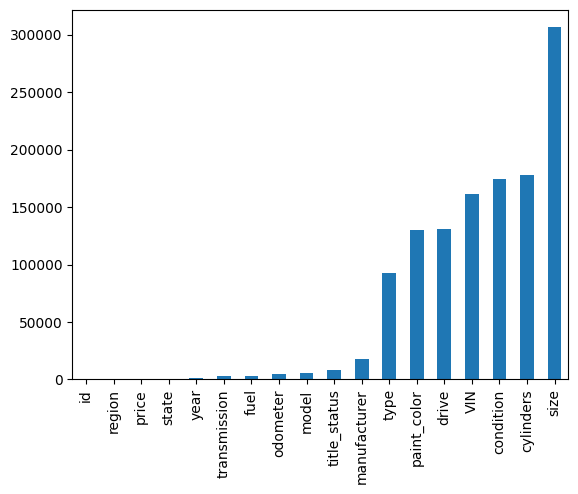

In [ ]:
df.isnull().sum().sort_values().plot(kind = "bar")

In [ ]:
df.isna().sum()

,0
id,0
region,0
price,0
year,1205
manufacturer,17646
model,5277
condition,174104
cylinders,177678
fuel,3013
odometer,4400


Clearly, there are a lot of null values in this dataset.

### Data Preparation

After our initial exploration and fine-tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`.

FIrst, let's handle the null values, column by column.

Year

In [ ]:
# drop rows with a null value for "year"
df.dropna(subset=['year'], inplace=True)

In [ ]:
df.isna().sum()

,0
id,0
region,0
price,0
year,0
manufacturer,16447
model,5209
condition,172909
cylinders,177591
fuel,2745
odometer,4331


Size

In [ ]:
df['type'].value_counts()

,count
type,
sedan,86860
SUV,76981
pickup,43128
truck,35279
other,22110
coupe,19181
hatchback,16588
wagon,10751
van,8457


In [ ]:
# For null values in "size":
# 1. Assign type "bus" the value 'full-size'
# 2. For hatchbacks and sedans, assign 'midsize'
# 3. For convertibles and coupes, assign 'compact'
# 4. For the rest of the null values, assign 'subcompact'
df.loc[(df['size'].isna()) & (df['type'] == 'bus'), 'size'] = 'full-size'

df.loc[(df['size'].isna()) & (df['type'] == 'hatchback'), 'size'] = 'mid-size'
df.loc[(df['size'].isna()) & (df['type'] == 'sedan'), 'size'] = 'mid-size'

df.loc[(df['size'].isna()) & (df['type'] == 'convertible'), 'size'] = 'compact'
df.loc[(df['size'].isna()) & (df['type'] == 'coupe'), 'size'] = 'compact'

df.loc[(df['size'].isna()), 'size'] = 'subcompact'

Condition

In [ ]:
df['condition'].value_counts()

,count
condition,
good,121456
excellent,101457
like new,21178
fair,6769
new,1305
salvage,601


<Axes: xlabel='condition'>

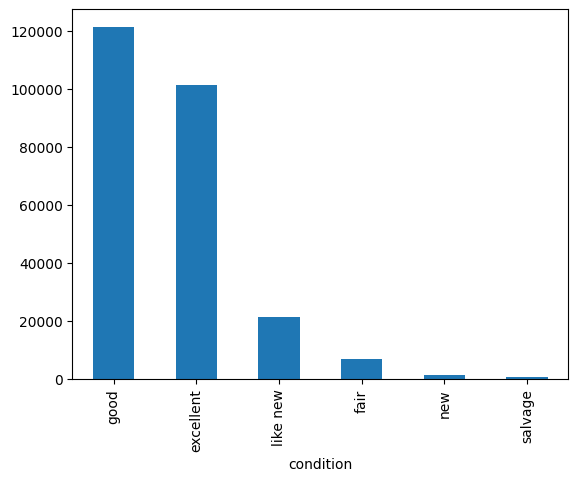

In [ ]:
df['condition'].value_counts().plot(kind='bar')

In [ ]:
# Fill the remaining null rows for condition with "good"
df['condition'] = df['condition'].fillna('good')

Transmission

In [ ]:
df['transmission'].value_counts()

,count
transmission,
automatic,335433
other,62661
manual,25093


In [ ]:
# Because the overwhelming amount of cars are automatic transmission, we can replace the null values for transmission with automatic
df['transmission'] = df['transmission'].fillna('automatic')

Manufacturer

In [ ]:
# Show the count of each model for cars with a null manufacturer
df[df['manufacturer'].isna()]['model'].value_counts()

,count
model,
Scion iM Hatchback 4D,640
smart fortwo Passion Hatchback,168
Genesis G80 3.8 Sedan 4D,163
Freightliner Cascadia,153
International 4300,148
...,...
John Deere 510 B,1
Cadilllac Eldorado,1
2009 Challenger SRT 8,1


These cars have null manufacturers, yet the value for their model has the manufacturer listed. They should be manually updated to include the manufacturer

In [ ]:
df.loc[df['model'].str.contains('scion', na=False), 'manufacturer'] = 'scion'
df.loc[df['model'].str.contains('smart', na=False), 'manufacturer'] = 'smart'
df.loc[df['model'].str.contains('genesis', na=False), 'manufacturer'] = 'genesis'
df.loc[df['model'].str.contains('international', na=False), 'manufacturer'] = 'international'
df.loc[df['model'].str.contains('deere', na=False), 'manufacturer'] = 'john deere'
df.loc[df['model'].str.contains('cadillac', na=False), 'manufacturer'] = 'cadillac'
df.loc[df['model'].str.contains('challenger', na=False), 'manufacturer'] = 'challenger'

In [ ]:
df['manufacturer'].value_counts()

,count
manufacturer,
ford,70983
chevrolet,55064
toyota,33953
honda,21269
nissan,19067
jeep,19014
ram,18342
gmc,16785
bmw,14699


In [ ]:
df.isna().sum()

,0
id,0
region,0
price,0
year,0
manufacturer,15555
model,5209
condition,0
cylinders,177591
fuel,2745
odometer,4331


In [ ]:
# Drop the remaining null values for manufacturer
df.dropna(subset=['manufacturer'], inplace=True)

Model

In [ ]:
# Drop the null values for model
df.dropna(subset=['model'], inplace=True)

Fuel

In [ ]:
df['fuel'].value_counts()

,count
fuel,
gas,341109
other,28717
diesel,25822
hybrid,5096
electric,1615


The overwhelming majority of values for "fuel" are "gas." We can fill the null values with gas.

In [ ]:
df['fuel'] = df['fuel'].fillna('gas')

Cyllinders

In [ ]:
# Filter the DataFrame for rows with NaN cylinders
nan_cylinders_df = df[df['cylinders'].isna()].copy()

# Apply np.where to this filtered DataFrame
# Use the .loc to assign values based on conditions within the SAME DataFrame (nan_cylinders_df)
nan_cylinders_df.loc[:, 'cylinders'] = np.where(nan_cylinders_df['size'] == 'full-size', 6, nan_cylinders_df['cylinders'])
nan_cylinders_df.loc[:, 'cylinders'] = np.where(nan_cylinders_df['size'] != 'full-size', 4, nan_cylinders_df['cylinders'])

# Update the original DataFrame using the modified 'cylinders' column from nan_cylinders_df
df.loc[nan_cylinders_df.index, 'cylinders'] = nan_cylinders_df['cylinders']

In [ ]:
df.isna().sum()

,0
id,0
region,0
price,0
year,0
manufacturer,0
model,0
condition,0
cylinders,0
fuel,0
odometer,4137


Odometer

In [ ]:
df['odometer'].value_counts()

,count
odometer,
100000.0,1848
1.0,1647
200000.0,1571
0.0,1548
150000.0,1458
...,...
252582.0,1
86225.0,1
107286.0,1


In [ ]:
# Replace null values with the mean of the odometer values
df['odometer'] = df['odometer'].fillna(df['odometer'].mean())

In [ ]:
# It would be more descriptive to divide the odometer values into three groups: high, medium, and low

# Odometer quantiles
odometer_quantiles = df['odometer'].quantile([0.33, 0.66])
low_threshold = odometer_quantiles[0.33]
high_threshold = odometer_quantiles[0.66]

# Create the new odometer column, using the thresholds above
df['odometer_category'] = pd.cut(df['odometer'],
                                  bins=[-float('inf'), low_threshold, high_threshold, float('inf')],
                                  labels=['low', 'medium', 'high'])

In [ ]:
#odometer median value
median_odometer = df['odometer'].median()
print(median_odometer)

86834.0


In [ ]:
#assign odometer median to odometer Nans
df['odometer'] = df['odometer'].fillna(median_odometer)

Title Status

In [ ]:
df['title_status'].value_counts()

,count
title_status,
clean,384649
rebuilt,6865
salvage,3648
lien,1323
missing,569
parts only,140


The values for Title Status are nearly all "clean." Null values can be filled with "clean."

In [ ]:
# Replace null values in title_status with "clean"
df['title_status'] = df['title_status'].fillna('clean')

VIN

Intuitively, VIN (Vehicle Identification Number) does not have any bearing on the sale of a used car. It could be used for identification, but with the "id" column already present, VIN is redundant. It can be dropped without consequence.

In [ ]:
# Drop the VIN column
df.drop(columns=['VIN'], inplace=True)

Paint Color

In [ ]:
df['paint_color'].value_counts()

,count
paint_color,
white,75021
black,60907
silver,41830
blue,29882
red,28622
grey,23621
green,6632
custom,6360
brown,6350


In [ ]:
#assign Nan values in paint_color to white or basic
df['paint_color'] = df['paint_color'].fillna('white')

Drive


In [ ]:
df['drive'].value_counts()

,count
drive,
4wd,128351
fwd,101418
rwd,53902


In [ ]:
nulls_in_drive=((df['drive'].isnull().sum()/df.shape[0])*100)
print('The percent of nulls in the Drive column is', nulls_in_drive)

The percent of nulls in the Drive column is 29.942555419449164


About 30% of the values for the Drive column are null. It'd be best to drop the column entirely with so many missing entries.

In [ ]:
# Drop drive
df.drop(columns=['drive'], inplace=True)

Type

In [ ]:
df.isna().sum()

,0
id,0
region,0
price,0
year,0
manufacturer,0
model,0
condition,0
cylinders,0
fuel,0
odometer,0


In [ ]:
df['type'].value_counts()

,count
type,
sedan,84483
SUV,75464
pickup,42082
truck,33256
other,20556
coupe,17880
hatchback,15458
wagon,10542
van,8194


In [ ]:
nulls_in_type=((df['type'].isnull().sum()/df.shape[0])*100)
print('The percent of nulls in the Type column is', nulls_in_type)

The percent of nulls in the Type column is 20.836626229896865


1/5 of the Type column is null, and there's no way to really handle them in a way that wouldn't affect the integrity of the rest of the data. It'd be best to just drop Type entirely.

In [ ]:
# Drop type
df.drop(columns=['type'], inplace=True)

Finally, let's check the data for missing values...

In [ ]:
df.isna().sum()

,0
id,0
region,0
price,0
year,0
manufacturer,0
model,0
condition,0
cylinders,0
fuel,0
odometer,0


The data is now null-free!

Finally, we should drop the "id" column, because it won't have any effect on price, and is merely a unique identifier for each car.

In [ ]:
df.drop(columns=['id'], inplace=True)

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [ ]:
import plotly.express as px
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# The target, y, is price, and the features, X, are all other columns
X=df.drop(columns=['price'])
y=df['price']

In [ ]:
# Split the data into training and testing sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=22)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)
print(type(X_train), type(y_train))

(283438, 14)
(121474, 14)
(283438,)
(121474,)
<class 'pandas.core.frame.DataFrame'> <class 'pandas.core.series.Series'>


In [ ]:
# Baseline model
baseline_train=np.full(y_train.shape, y_train.mean())
baseline_test=np.full(y_test.shape, y_train.mean())
mse_baseline_train=mean_squared_error(y_train, baseline_train)
mse_baseline_test=mean_squared_error(y_test, baseline_test)
print(baseline_train.shape, baseline_test.shape)
print(f'Baseline for training data: {mse_baseline_train}')
print(f'Baseline for testing data: {mse_baseline_test}')

(283438,) (121474,)
Baseline for training data: 180056826692321.06
Baseline for testing data: 255823049718.6457


In [ ]:
# What features have the highest positive correlation with price?
best_corr = None
best_col = None
for col in X_train.select_dtypes(include=np.number).columns:
  corr = X_train[col].corr(y_train)
  if best_corr is None or abs(corr) > abs(best_corr):
     best_corr = corr
     best_col = col
highest_corr=best_col
print(highest_corr)

year


In [ ]:
# Create a pipeline to include linear regression and one hot encoding
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

pipe=Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore')), ('linreg', LinearRegression())])
model = pipe.fit(X_train[['year', 'odometer']], y_train)

In [ ]:
# Use the model to make predictions
pred_train=model.predict(X_train[['year', 'odometer']])
pred_test=model.predict(X_test[['year', 'odometer']])
pred_train_mse=mean_squared_error(y_train, pred_train)
pred_test_mse=mean_squared_error(y_test, pred_test)

# Return the MSE for the training and testing sets
print(model.named_steps)
print(f'Train MSE: {pred_train_mse: .2f}')
print(f'Test MSE: {pred_test_mse: .2f}')
pipe

{'onehot': OneHotEncoder(handle_unknown='ignore'), 'linreg': LinearRegression()}
Train MSE:  179010283752203.19
Test MSE:  1363012442129.93


Pipeline(steps=[('onehot', OneHotEncoder(handle_unknown='ignore')),
                ('linreg', LinearRegression())])

In [ ]:
# Create a dataframe for the predictions, and include
predictions_df = X_test[['year', 'odometer']].copy()
predictions_df['predictions'] = model.predict(X_test[['year', 'odometer']])

In [ ]:
predictions_df.head()

,year,odometer,predictions
42001,2016.0,85455.0,-283.201460
5747,2018.0,74952.0,-51160.937400
238666,2017.0,46812.0,-15486.882783
83948,2016.0,35348.0,15146.324128
69779,2019.0,25249.0,-25892.494714


In [ ]:
# Merge the predictions back into the original df:
df = pd.merge(df, predictions_df[['predictions']], left_index=True, right_index=True, how='left')

In [ ]:
df.head()

,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,size,paint_color,state,odometer_category,predictions
27,auburn,33590,2014.0,gmc,sierra 1500 crew cab slt,good,8 cylinders,gas,57923.0,clean,other,subcompact,white,al,medium,NaN
28,auburn,22590,2010.0,chevrolet,silverado 1500,good,8 cylinders,gas,71229.0,clean,other,subcompact,blue,al,medium,20703.349311
29,auburn,39590,2020.0,chevrolet,silverado 1500 crew,good,8 cylinders,gas,19160.0,clean,other,subcompact,red,al,low,NaN
30,auburn,30990,2017.0,toyota,tundra double cab sr,good,8 cylinders,gas,41124.0,clean,other,subcompact,red,al,low,NaN
31,auburn,15000,2013.0,ford,f-150 xlt,excellent,6 cylinders,gas,128000.0,clean,automatic,full-size,black,al,high,NaN


In [ ]:
# Create a plotly figure to compare the predictions for the testing and training sets to the actual y (price) values
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['year'], y=df['price'], mode='markers', name='actual'))
fig.add_trace(go.Scatter(x=X_test['year'], y=y_test, mode='markers', name='test'))
fig.add_trace(go.Scatter(x=X_train['year'], y=y_train, mode='markers', name='train'))
fig

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high-quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight into drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

---
The original question we were hoping to answer was what drives the price of a used car. Based on our iterative approach to linear regression, a clear answer emerges. The price of a used car, according to the created model, is driven primarily by year and odometer: that is to say, by the age of a car and and the miles on it.

The selection of these features proved highly predictive in our model. While more features could have been looked at and evaluated in this regard, the .corr method sufficed to give us two prominent features. These features were not only proven to be good predictors based on our model: they intuitively fit into what one may think drives the price of a used car. A new car with a high odometer value will have a high price, and vice versa.

Ultimately, when determining the price of a used car, the generated model can be highly predictive.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine-tuning their inventory.

---

The model we arrived at has proven to be very predictive. Indeed, it tells us that the price of a used car is influenced by two major features: date (or the age of a car), and the odometer reading.



This scatterplot figure above tells us that our model is able to predict the price almost all the time. The model itself was trained on the date and odometer features, and is therefore tuned around maximizing those attributes.

Our recommendation, when it comes to considering used car inventory, is to prioritize newer cars with lower odometer readings. These cars are naturally more valuable and can be priced higher to reflect that. Customers will also be interested in purchasing newer cars rather than older cars, so demand will exist.